In [1]:
using Pkg
Pkg.activate("../..")
using Plots, ForwardDiff, SymbolicNumericIntegration, SymPy
include("../../julia_chaos/src/tools.jl")
using .Solvers

  Activating project at `~/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos`


## Intro

A remarkable characteristic of physical systems is the presence of non-trivial parameters of variuos types, and different behavior. For example, the Standard Model of particle physics has the very important fine structure constant $\alpha$, or any fluid simulation counts on the viscosity as parameter.

Those parameters give different behaviors to systems, and at some regime, totally determine the way control parameters create a transition phase in the dynamics. That point is called a **bifurcation** point.

We will see how to find those points in the dynamics of a simple system, and how to use them to find the bifurcation diagram of the system. But first, let us study what types of bifurcations are possible.

## Saddle Node bifurcation

The most fundamental way in which the dynamics of a system change is when sources or  sinks are added to the system. This is called a **saddle node bifurcation**, whose normal model DE is given by our control parameter $r$ and the state variable $x$:

$$\dot x = r + x^2$$

notably, when r increases some points arise:


┌ Info: Saved animation to /tmp/jl_nSVsn8nOtg.gif
└ @ Plots /home/jose/.julia/packages/Plots/M4dfL/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_nSVsn8nOtg.gif")
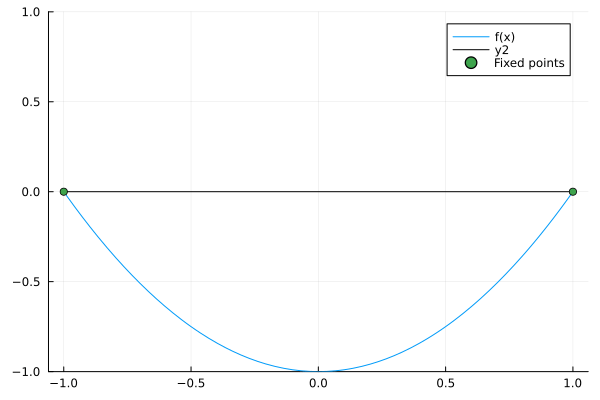

In [2]:
rs = Vector(-1:0.1:1)
xs = Vector(-1:0.0001:1)
anim = @animate for r in rs
    f(x) = r + x^2
    plot(f, -1, 1, label="f(x)", ylim=(-1, 1), legend=:topright)
    plot!(x -> 0, -1, 1, color=:black)
    closer_to_zero = abs.(f.(range(minimum(xs), maximum(xs), 1000))) .< 0.001
    interscet = range(minimum(xs), maximum(xs), 1000)[closer_to_zero]
    scatter!(interscet, f.(interscet), label="Fixed points", markershape=:circle)
end
gif(anim, fps=10)

Here, as in all 1-D saddle node bifurcations, a pair of stable and unstable nodes arise. This can be easily represented in the **bifurcation diagram**:

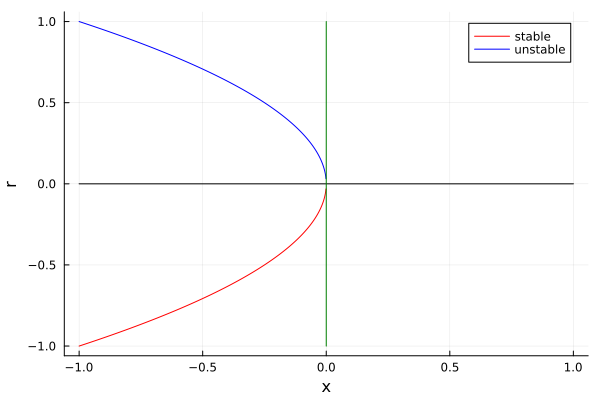

In [3]:
xs = Vector(-1:0.001:1)
fr_stable(x) = - sqrt(-x)
fr_unstable(x) = sqrt(-x)
neg_mask = xs .< 0

plot(xs[neg_mask], fr_stable.(xs[neg_mask]), label="stable", color=:red)
plot!(xs[neg_mask], fr_unstable.(xs[neg_mask]), label="unstable", color=:blue)
plot!(xs, xs.*0, color=:black, xlabel="x", label="")
plot!(xs.*0, xs, color=:green, ylabel="r", label="")

There is a unique characteristic of this type of value, and it is that happens only when the intersection of the line with the parameter and the function have the same slope, we can verify this in the following example:

---

Example:
Lets see the behaviour of the DE: $$\dot x = r - x - e^{-x} $$

We note that the fixed points occur when $$f(x) = 0$$ so we have:

$$0 = r - x - e^{-x} \ \ \Rightarrow \ \ r -x = e^{-x}$$

┌ Info: Saved animation to /tmp/jl_hqvwxiLod0.gif
└ @ Plots /home/jose/.julia/packages/Plots/M4dfL/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_hqvwxiLod0.gif")
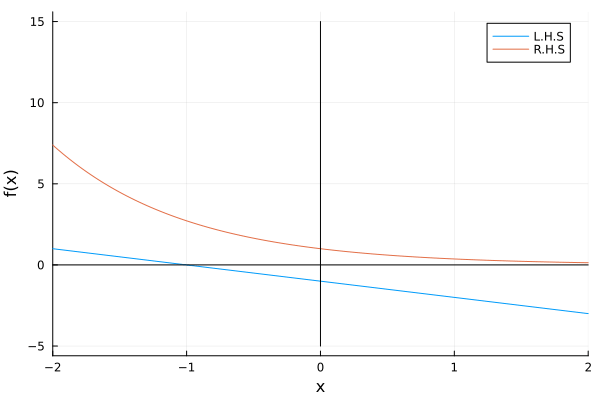

In [4]:
rs = Vector(-1:0.1:4)
xs = Vector(-2:0.01:4)

anim = @animate for r in rs
    y_1 = r .- xs
    y_2 = ℯ.^(-xs)
    plot(xs, y_1, label="L.H.S", legend=:topright, xlabel="x", ylabel="f(x)", xlim=(-2, 2))
    plot!(xs, y_2, label="R.H.S")
    plot!(xs, xs.*0, color=:black, label="")
    plot!(Vector(-5:0.01:15).*0, Vector(-5:0.01:15), color=:black, label="")
    if r>1
        plot!( xs, 1 .- xs, color=:red, label="Same slope")
    end
end
gif(anim, fps=10)

--- 

### Normal modes

You might be wondering, why is this DE equation generating a saddle node, if the form looks nothing like the one above, the answer is very straight... The linearization scheme maps this local form to the standard one we saw before, this is verifiable via a Taylor expansion of the function:

$$f(x) = r - x - e^{-x}$$
$$\dot x \approx f(x') + f'(x)|_{x'} \cdot x + O(x)$$
$$\dot x \approx (r-1) - x^2/2.$$

And so, the leading order in $x$ behaves the same way the initial saddle node characteristic system did.

## Transcritical bifurcation

In the bifurcations above, we had a pair which was created out of the vacuum, but this not always the case... it is possible to have a fixed point, whose stability changes as the tweakable parameter does. The normal form of this type of bifurcation is:

$$\dot x =rx - x^2$$

And as we can see the fixed point at $x=0$ remains constant $\forall r$, but the stability changes. This is called a **transcritical point**.

┌ Info: Saved animation to /tmp/jl_zw1GBsVsfu.gif
└ @ Plots /home/jose/.julia/packages/Plots/M4dfL/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_zw1GBsVsfu.gif")
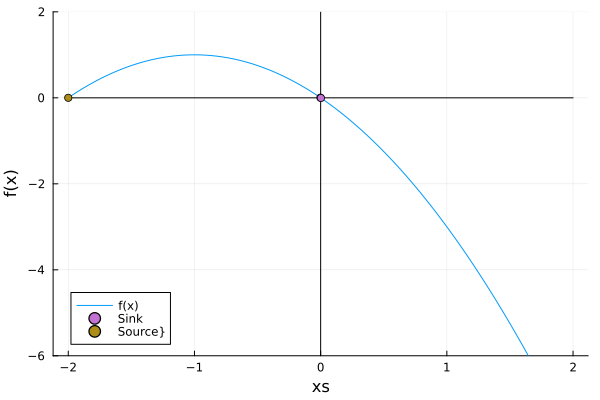

In [5]:
rs = Vector(-2:0.1:2)
xs = Vector(-2:0.01:2)

anim = @animate for r in rs
    f_tc = x -> r .* x - x^2
    plot(xs, f_tc, label="f(x)", ylim=(-6, 2))
    plot!(xs, xs.*0, color=:black, label="", xlabel = "xs")
    plot!(Vector(-6:0.01:2).*0, Vector(-6:0.01:2), color=:black, label="", ylabel="f(x)")
    closer_to_zero = abs.(f_tc.(range(minimum(xs), maximum(xs), 1000))) .< 0.005
    interscet = range(minimum(xs), maximum(xs), 1000)[closer_to_zero]
    stable = is_stalbe.(interscet, f_tc)
    scatter!(interscet[stable], f_tc.(interscet[stable]), label="Sink", markershape=:circle)
    scatter!(interscet[.!stable], f_tc.(interscet[.!stable]), label="Source}", markershape=:circle)

end
gif(anim, fps=10)

In the animation above, that both fixed points just exchanged stabilities. The bifurcation diagram remarks this fact:

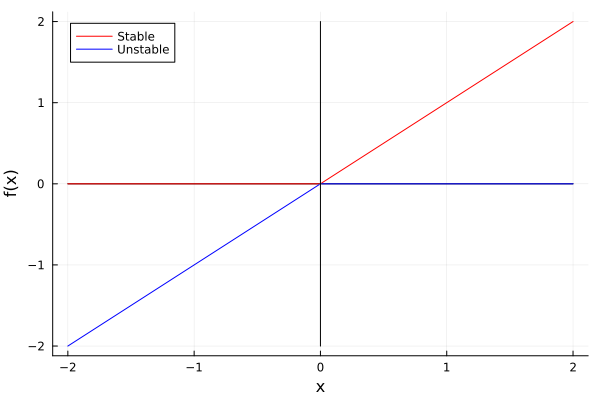

In [6]:
rs = Vector(-2:0.01:2)
xs = Vector(-2:0.01:2)
plot(xs, xs.*0, color=:black, label="", xlabel = "x")
plot!(Vector(-2:0.01:2).*0, Vector(-2:0.01:2), color=:black, label="", ylabel="f(x)")
plot!(xs[xs.<0], xs[xs.<0].*0, label="Stable", color=:red)
plot!(xs[xs.>0], xs[xs.>0], label="", color=:red)
plot!(xs[xs.>0], xs[xs.>0].*0, label="Unstable", color=:blue)
plot!(xs[xs.<0], xs[xs.<0], label="", color=:blue)

## Pitchfork bifurcation

There is a type of bifurcation which appears when the function is naturally equivariant under some transformation in the cartesian plane. This creates two type of bifurcations:

###  Supercritical Pitchfork

This is the case when the function is equivariant under a flip in the $x$ axis (i.e. $f(x) = -f(-x)$). The normal form of this bifurcation is:

$$\dot x = rx - x^3$$

Here, as we'll see, there is a fixed point, and two others appear from it... The phenomenon is quite similar to the one in the saddle node, but in this case, there is a fixed point instead of the vacuum:

┌ Info: Saved animation to /tmp/jl_PKNed6Ho1y.gif
└ @ Plots /home/jose/.julia/packages/Plots/M4dfL/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_PKNed6Ho1y.gif")
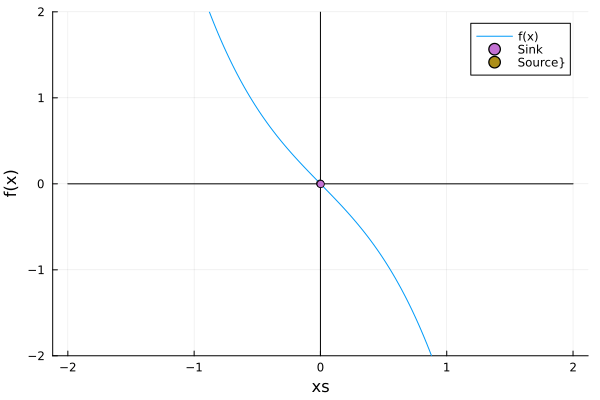

In [7]:
rs = Vector(-1.5:0.1:1.5)
xs = Vector(-2:0.0001:2)

anim = @animate for r in rs
    f_tc = x -> r .* x - x^3
    plot(xs, f_tc, label="f(x)", ylim=(-2, 2))
    plot!(xs, xs.*0, color=:black, label="", xlabel = "xs")
    plot!(Vector(-2:0.01:2).*0, Vector(-2:0.01:2), color=:black, label="", ylabel="f(x)")
    closer_to_zero = abs.(f_tc.(range(minimum(xs), maximum(xs), 1000))) .< 0.005
    interscet = range(minimum(xs), maximum(xs), 1000)[closer_to_zero]
    stable = is_stalbe.(interscet, f_tc)
    scatter!(interscet[stable], f_tc.(interscet[stable]), label="Sink", markershape=:circle)
    scatter!(interscet[.!stable], f_tc.(interscet[.!stable]), label="Source}", markershape=:circle)

end
gif(anim, fps=10)

Of course, this DE manifests the invariance:

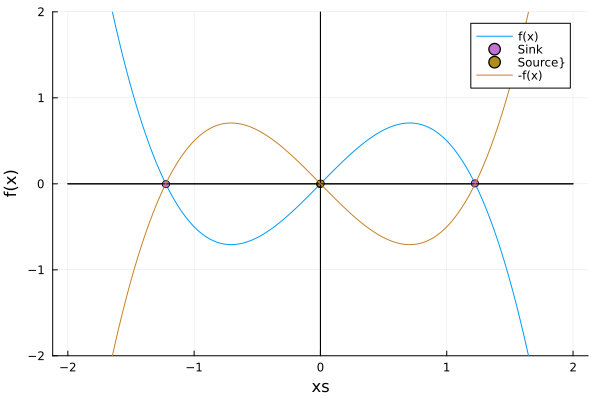

In [8]:
plot!(xs, xs.*0, color=:black, label="", xlabel = "xs")
plot!(xs.*0, xs, color=:black, label="", ylabel="f(x)")
plot!(xs, x -> -1.5 .* x + x^3, label="-f(x)", ylim=(-2, 2))


And, as an excellent named mathematical property, the bifurcation diagram is a **pitchfork**:

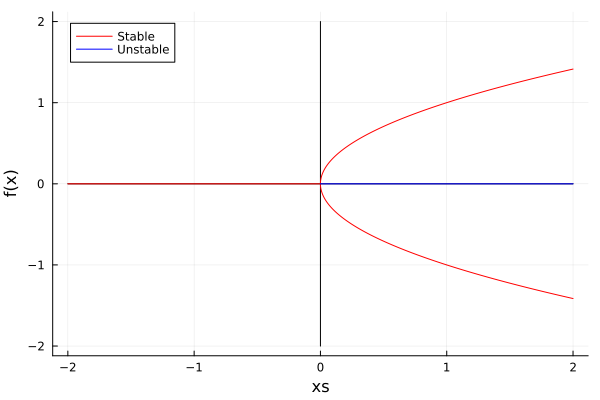

In [9]:
plot(xs, xs.*0, color=:black, label="", xlabel = "xs")
plot!(xs.*0, xs, color=:black, label="", ylabel="f(x)")
plot!(xs[xs.<0], xs[xs.<0].*0, label="Stable", color=:red)
plot!(xs[xs.>0], sqrt.(xs[xs.>0]), label="", color=:red)
plot!(xs[xs.>0], -sqrt.(xs[xs.>0]), label="", color=:red)
plot!(xs[xs.>0], xs[xs.>0].*0, label="Unstable", color=:blue)


--- 

Example: Compute the potential of this normal form, and evaluate what happens when $r$ changes.

Recall that to find the potental, we need to integrate the function:

$$\dot{x} = -\frac{\partial V(x)}{\partial x} \ \ \Rightarrow \ \ \frac{d x}{d t}= -\frac{\partial V(x)}{\partial x} $$

$$V(x) = -\int_{x_0}^x \dot{x} \ dx $$


┌ Info: Saved animation to /tmp/jl_Pir2xyLKL2.gif
└ @ Plots /home/jose/.julia/packages/Plots/M4dfL/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_Pir2xyLKL2.gif")
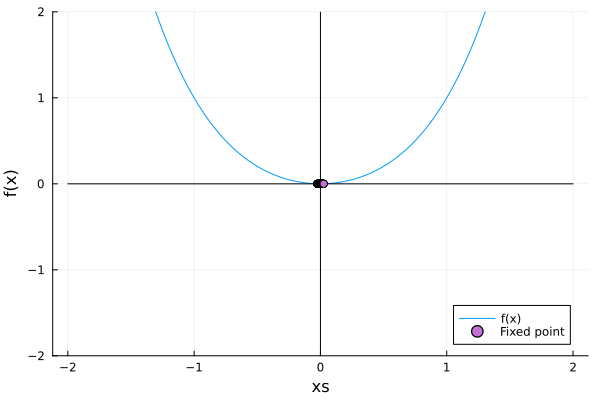

In [10]:
rs = Vector(-1.5:0.1:1.5)
xs = Vector(-2:0.0001:2)

anim = @animate for r in rs
    V(x) = x^4/4 - r.*x^2/2
    plot(xs, V, label="f(x)", ylim=(-2, 2))
    plot!(xs, xs.*0, color=:black, label="", xlabel = "xs")
    plot!(Vector(-2:0.01:2).*0, Vector(-2:0.01:2), color=:black, label="", ylabel="f(x)")
    closer_to_zero = abs.(V.(range(minimum(xs), maximum(xs), 10000))) .< 0.0005
    interscet = range(minimum(xs), maximum(xs), 10000)[closer_to_zero]
    stable = is_stalbe.(interscet, V)
    scatter!(interscet, V.(interscet), label="Fixed point", markershape=:circle)
end
gif(anim, fps=10)

---

### Subcritical Pitchfork

We just saw that when $r$ increases, the point at $x=0$ went from unstable to stability, this is called a stabilizing effect. But the opposite can also happen (to go from sink to source). This is achieved with a simple sign change:

$$\dot x = rx + x^3$$

And the bifurcation diagram becomes:

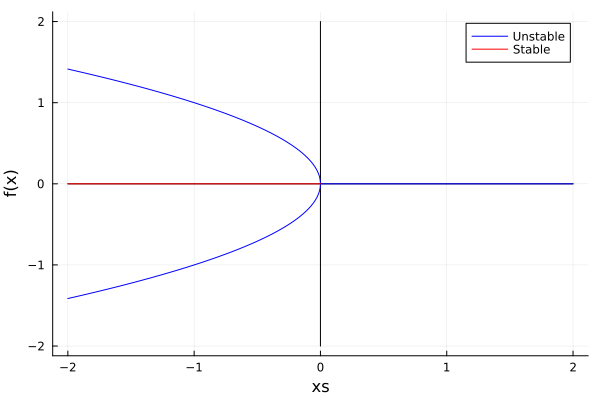

In [11]:
plot(xs, xs.*0, color=:black, label="", xlabel = "xs")
plot!(xs.*0, xs, color=:black, label="", ylabel="f(x)")
plot!(xs[xs.>0], xs[xs.<0].*0, label="Unstable", color=:blue)
plot!(xs[xs.<0], sqrt.(-xs[xs.<0]), label="", color=:blue)
plot!(xs[xs.<0], -sqrt.(-xs[xs.<0]), label="", color=:blue)
plot!(xs[xs.<0], xs[xs.>0].*0, label="Stable", color=:red)

## Conclusion

We saw the three main types of bifurcations, and how to find them in the dynamics of a system. We also saw how to find the bifurcation diagram of a system, and how to use it to find the bifurcation points, as the configurations put the system in different regimes. This case is not very far from the N-parameters one, as a simple dimensional analysis can takw us to a uncoupled system, and then we can use the same techniques to find the bifurcation points for each term.

To summarize, the key ideas from this chapter are:

- **bifurcations** are the way in which the dynamics of a system change when a parameter is changed.
- **Saddle-node Bifurcations**: Given by systems of the form $\dot x = r + x^2$, where $r$ is the control parameter. The phenomena is a pain of stable-unstable fixed points arise from the vacuum.
- **Transcritical Bifurcations**: Given by systems of the form $\dot x = rx - x^2$, where $r$ is the control parameter. The phenomena is that a fixed point remains but with its stability changed.
- **Pitchfork Bifurcations**: Given by systems of the form $\dot x = rx \pm x^3$, where $r$ is the control parameter. The phenomena is a pair of nodes arising from a single fixed point, which also remains at the end, and can be either stable or unstable.